# GWAS Data Processing Pipeline

## 1. Load the Data
* First, read the GWAS summary statistics file into a DataFrame using pandas. (MONDO_0004975 from GWAS Catalog for AD)

In [7]:
import pandas as pd

# Load the GWAS summary statistics data
file_path = "gwas-association-downloaded_2025-03-05-MONDO_0004975-withChildTraits.tsv"  # Update with your actual file path
df = pd.read_csv(file_path, sep="\t", dtype=str)  # Ensure all columns are read as strings to avoid conversion errors

# Display the first few rows
print(df.columns)
df.head()

Index(['DATE ADDED TO CATALOG', 'PUBMEDID', 'FIRST AUTHOR', 'DATE', 'JOURNAL',
       'LINK', 'STUDY', 'DISEASE/TRAIT', 'INITIAL SAMPLE SIZE',
       'REPLICATION SAMPLE SIZE', 'REGION', 'CHR_ID', 'CHR_POS',
       'REPORTED GENE(S)', 'MAPPED_GENE', 'UPSTREAM_GENE_ID',
       'DOWNSTREAM_GENE_ID', 'SNP_GENE_IDS', 'UPSTREAM_GENE_DISTANCE',
       'DOWNSTREAM_GENE_DISTANCE', 'STRONGEST SNP-RISK ALLELE', 'SNPS',
       'MERGED', 'SNP_ID_CURRENT', 'CONTEXT', 'INTERGENIC',
       'RISK ALLELE FREQUENCY', 'P-VALUE', 'PVALUE_MLOG', 'P-VALUE (TEXT)',
       'OR or BETA', '95% CI (TEXT)', 'PLATFORM [SNPS PASSING QC]', 'CNV',
       'MAPPED_TRAIT', 'MAPPED_TRAIT_URI', 'STUDY ACCESSION',
       'GENOTYPING TECHNOLOGY'],
      dtype='object')


,DATE ADDED TO CATALOG,PUBMEDID,FIRST AUTHOR,DATE,JOURNAL,LINK,STUDY,DISEASE/TRAIT,INITIAL SAMPLE SIZE,REPLICATION SAMPLE SIZE,...,PVALUE_MLOG,P-VALUE (TEXT),OR or BETA,95% CI (TEXT),PLATFORM [SNPS PASSING QC],CNV,MAPPED_TRAIT,MAPPED_TRAIT_URI,STUDY ACCESSION,GENOTYPING TECHNOLOGY
0,2018-12-18,29360470,Miron J,2018-01-19,Alzheimers Dement,www.ncbi.nlm.nih.gov/pubmed/29360470,CDK5RAP2 gene and tau pathophysiology in late-...,Late-onset Alzheimer's disease,966 Quebec (founder/genetic isolate) ancestry ...,"340 cases, 195 controls",...,49.0,NaN,NaN,NaN,Illumina [NR],N,late-onset Alzheimers disease,http://www.ebi.ac.uk/efo/EFO_1001870,GCST006806,Genome-wide genotyping array
1,2017-03-24,27770636,Mez J,2016-10-20,Alzheimers Dement,www.ncbi.nlm.nih.gov/pubmed/27770636,"Two novel loci, COBL and SLC10A2, for Alzheime...",Late-onset Alzheimer's disease,"1,825 African American ancestry cases, 3,784 A...",NaN,...,6.301029995663981,(liability model),1.14,[0.69-1.59] unit decrease,NR [19725427] (imputed),N,late-onset Alzheimers disease,http://www.ebi.ac.uk/efo/EFO_1001870,GCST003815,Genome-wide genotyping array
2,2017-03-24,27770636,Mez J,2016-10-20,Alzheimers Dement,www.ncbi.nlm.nih.gov/pubmed/27770636,"Two novel loci, COBL and SLC10A2, for Alzheime...",Late-onset Alzheimer's disease,"1,825 African American ancestry cases, 3,784 A...",NaN,...,5.045757490560675,(liability model),0.28,[0.16-0.4] unit increase,NR [19725427] (imputed),N,late-onset Alzheimers disease,http://www.ebi.ac.uk/efo/EFO_1001870,GCST003815,Genome-wide genotyping array
3,2017-03-24,27770636,Mez J,2016-10-20,Alzheimers Dement,www.ncbi.nlm.nih.gov/pubmed/27770636,"Two novel loci, COBL and SLC10A2, for Alzheime...",Late-onset Alzheimer's disease,"1,825 African American ancestry cases, 3,784 A...",NaN,...,5.698970004336019,(liability model),0.28,[0.16-0.4] unit increase,NR [19725427] (imputed),N,late-onset Alzheimers disease,http://www.ebi.ac.uk/efo/EFO_1001870,GCST003815,Genome-wide genotyping array
4,2017-03-24,27770636,Mez J,2016-10-20,Alzheimers Dement,www.ncbi.nlm.nih.gov/pubmed/27770636,"Two novel loci, COBL and SLC10A2, for Alzheime...",Late-onset Alzheimer's disease,"1,825 African American ancestry cases, 3,784 A...",NaN,...,5.522878745280337,(liability model),0.31,[0.17-0.45] unit increase,NR [19725427] (imputed),N,late-onset Alzheimers disease,http://www.ebi.ac.uk/efo/EFO_1001870,GCST003815,Genome-wide genotyping array


## 2. Clean and Format the Data
Before performing any analysis, we may need to clean the data:

*  Remove missing values: Drop rows with missing values in essential columns.
* Standardize column names: Ensure consistent naming conventions.
* Convert numeric fields: Convert P-VALUE, OR or BETA, CHR_POS, etc., to numeric types.

In [8]:
# Drop rows with missing essential values
essential_columns = ["P-VALUE", "CHR_ID", "CHR_POS", "STRONGEST SNP-RISK ALLELE"]
df.dropna(subset=essential_columns, inplace=True)

# Convert numeric fields
df["P-VALUE"] = pd.to_numeric(df["P-VALUE"], errors='coerce')
df["OR or BETA"] = pd.to_numeric(df["OR or BETA"], errors='coerce')
df["CHR_POS"] = pd.to_numeric(df["CHR_POS"], errors='coerce')

# Standardize column names
df.columns = df.columns.str.replace(" ", "_").str.upper()


## 3 Filter Data
To extract SNPs of interest, filter by specific conditions:

* Filter by disease/trait (e.g., Alzheimer’s disease)
* Filter by chromosome
* Filter by p-value threshold (significance level)

In [12]:
# Filter for Alzheimer's disease
alzheimers_df = df[df["DISEASE/TRAIT"].str.contains("Alzheimer", case=False, na=False)]

# Filter for significant SNPs (p-value < 5e-8)
significant_snps = alzheimers_df[alzheimers_df["P-VALUE"] < 5e-8]

# Display filtered results
import ace_tools_open as tools
tools.display_dataframe_to_user(name="Filtered GWAS Data", dataframe=significant_snps)


Filtered GWAS Data


## 4 Perform Summary Statistics
Summarize the GWAS results:

In [17]:
# Count SNPs per chromosome
chr_counts = df["CHR_ID"].value_counts()

# Get top SNPs with the lowest p-values
top_snps = df.nsmallest(10, "P-VALUE")

# Display summary
print("SNP Counts per Chromosome:\n", chr_counts)
print("\nTop 10 Most Significant SNPs:\n", top_snps[["SNPS", "P-VALUE", "OR_OR_BETA"]])


SNP Counts per Chromosome:
 CHR_ID
19          730
2           255
11          214
6           207
7           202
1           179
8           164
5           164
3           148
17          142
4           116
12          111
15          104
16          101
10          100
14           83
9            83
13           64
20           59
18           43
21           41
22           22
X            21
15 x 5        1
5 x 15        1
8;8;8         1
1;1           1
10;10;10      1
Name: count, dtype: int64

Top 10 Most Significant SNPs:
              SNPS        P-VALUE  OR_OR_BETA
1016     rs429358   0.000000e+00    3.320000
1544     rs814573   0.000000e+00         NaN
3266     rs429358  9.881313e-324    0.922100
1092     rs438811  2.000000e-308    0.103814
2703     rs429358  2.000000e-303    3.210000
266      rs429358  1.000000e-300         NaN
1896  rs146275714  1.000000e-300    1.114150
1897     rs429358  1.000000e-300    1.179240
1898   rs12691088  1.000000e-300    1.183050
2878    r

## 5. Visualization
* We can visualize the results with a Manhattan plot (a common GWAS visualization).

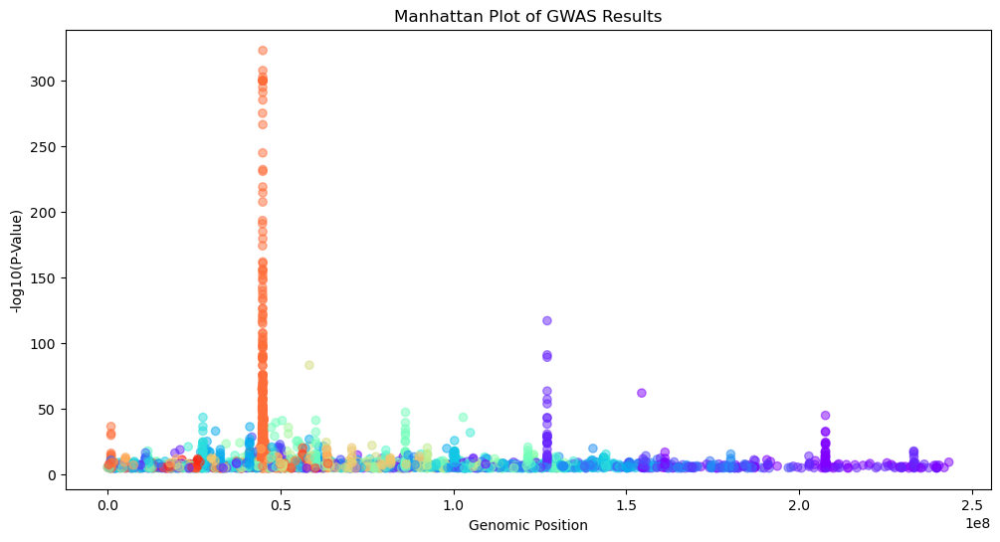

In [20]:
import matplotlib.pyplot as plt
import numpy as np
# Convert CHR_ID to numeric, dropping non-numeric values
df = df[pd.to_numeric(df["CHR_ID"], errors='coerce').notna()]
df["CHR_ID"] = df["CHR_ID"].astype(int)

# Ensure no zero values in P-VALUE column before applying log10
df["P-VALUE"] = pd.to_numeric(df["P-VALUE"], errors='coerce')  # Convert to numeric, forcing errors to NaN
df["P-VALUE"] = df["P-VALUE"].replace(0, 1e-300)  # Replace zero values with a small number
df.dropna(subset=["P-VALUE"], inplace=True)  # Remove NaN values

# Manhattan plot
plt.figure(figsize=(12, 6))
plt.scatter(df["CHR_POS"], -df["P-VALUE"].apply(lambda x: np.log10(x)), c=df["CHR_ID"], cmap="rainbow", alpha=0.5)
plt.xlabel("Genomic Position")
plt.ylabel("-log10(P-Value)")
plt.title("Manhattan Plot of GWAS Results")
plt.show()


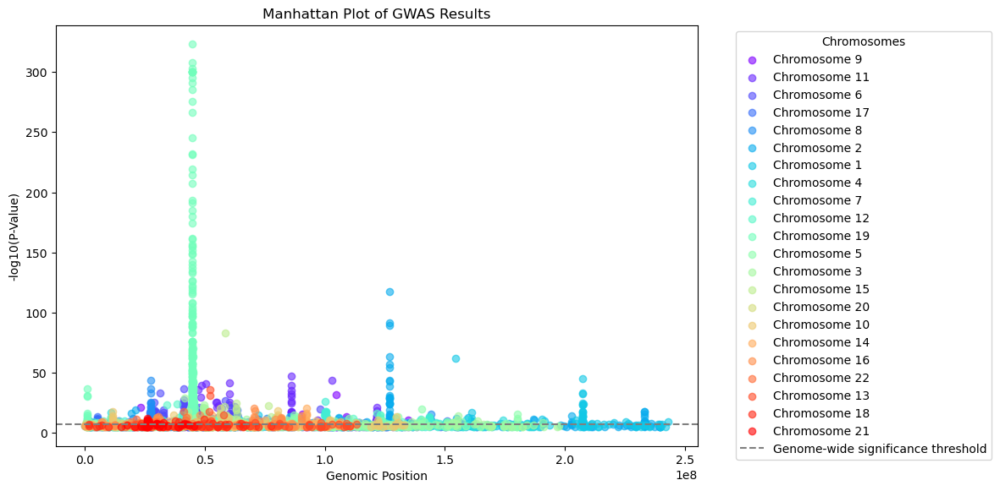

In [41]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


# Convert CHR_ID to numeric, dropping non-numeric values
df = df[pd.to_numeric(df["CHR_ID"], errors='coerce').notna()]
df["CHR_ID"] = df["CHR_ID"].astype(int)

# Ensure no zero values in P-VALUE column before applying log10
df["P-VALUE"] = pd.to_numeric(df["P-VALUE"], errors='coerce')  # Convert to numeric, forcing errors to NaN
df["P-VALUE"] = df["P-VALUE"].replace(0, 1e-300)  # Replace zero values with a small number
df.dropna(subset=["P-VALUE"], inplace=True)  # Remove NaN values

# Create a color map for chromosomes
chromosomes = df["CHR_ID"].unique()
colors = plt.cm.rainbow(np.linspace(0, 1, len(chromosomes)))
color_dict = {chrom: color for chrom, color in zip(chromosomes, colors)}

# Manhattan plot
plt.figure(figsize=(12, 6))
for chrom in chromosomes:
    chrom_data = df[df["CHR_ID"] == chrom]
    plt.scatter(
        chrom_data["CHR_POS"],
        -np.log10(chrom_data["P-VALUE"]),
        color=color_dict[chrom],
        alpha=0.6,
        label=f'Chromosome {chrom}'
    )

# Add genome-wide significance threshold line
plt.axhline(y=-np.log10(5e-8), color='gray', linestyle='--', label='Genome-wide significance threshold')

plt.xlabel("Genomic Position")
plt.ylabel("-log10(P-Value)")
plt.title("Manhattan Plot of GWAS Results")
plt.legend(title="Chromosomes", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


## 6. Save Processed Data
After processing, save the cleaned and filtered data:

In [ ]:
# output_file = "processed_gwas_data.csv"
# significant_snps.to_csv(output_file, index=False)
# print(f"Processed GWAS data saved to {output_file}")


# Analysis

## 1. Perform Gene Annotation (Link SNPs to Genes)
To map SNPs to genes, we can use gene annotation databases like Ensembl, RefSeq, or external tools such as ANNOVAR, Biomart, or Harmonizome.

### Step 1.1: Annotate SNPs with Nearby Genes
We will:

* Use the MAPPED_GENE and REPORTED_GENE(S) columns from the GWAS summary.
* Retrieve gene names based on chromosomal position (CHR_ID, CHR_POS) if missing.
Python Code for SNP-Gene Mapping
We can cross-reference SNP positions with Ensembl gene annotations:

In [21]:
import requests

# Function to query Ensembl and get nearby genes for a SNP
def get_gene_from_ensembl(chr_id, pos):
    server = "https://rest.ensembl.org"
    ext = f"/overlap/region/human/{chr_id}:{pos}-{pos}?feature=gene"
    headers = {"Content-Type": "application/json"}
    response = requests.get(server + ext, headers=headers)
    
    if not response.ok:
        return None
    
    genes = response.json()
    gene_names = [gene["gene_id"] for gene in genes if "gene_id" in gene]
    
    return ", ".join(gene_names) if gene_names else None

# Annotate missing genes
for index, row in significant_snps.iterrows():
    if pd.isna(row["MAPPED_GENE"]) or row["MAPPED_GENE"] == "":
        gene_name = get_gene_from_ensembl(row["CHR_ID"], row["CHR_POS"])
        significant_snps.at[index, "MAPPED_GENE"] = gene_name if gene_name else "Unknown"

# Display results
tools.display_dataframe_to_user(name="SNP-Gene Annotation", dataframe=significant_snps)


SNP-Gene Annotation


## 2. Identify Pathway Enrichment (GWAS SNPs to Biological Pathways)
Once we have gene annotations, we can map these genes to biological pathways using databases like:

* KEGG (Kyoto Encyclopedia of Genes and Genomes)
* Reactome (biological pathways)
* GO (Gene Ontology) (functional annotations)
* GSEA (Gene Set Enrichment Analysis)

### Step 2.1: Pathway Enrichment Analysis Using gProfiler
We can use gProfiler (an online tool) or gprofiler Python API to find pathways linked to significant genes.

In [24]:
from gprofiler import GProfiler

gp = GProfiler(return_dataframe=True)

# Extract unique genes from significant SNPs
gene_list = list(set(significant_snps["MAPPED_GENE"].dropna()))

# Perform pathway enrichment analysis
pathway_results = gp.profile(organism='hsapiens', query=gene_list)

# Display enriched pathways
tools.display_dataframe_to_user(name="Pathway Enrichment Analysis", dataframe=pathway_results)


Pathway Enrichment Analysis


## 3. Integrate GWAS Results with Expression Data for Functional Analysis
### Step 3.1: Cross-reference with Gene Expression Data
To understand functional relevance, we can integrate the GWAS results with expression data from resources like:

* GTEx (Genotype-Tissue Expression project) for tissue-specific expression.
* RNA-seq databases (e.g., GEO, TCGA) for disease-specific expression changes.
Python Code to Query GTEx for Gene Expression

In [40]:
import requests
def get_gtex_gencodeId(geneSymbol):
    url = f"https://gtexportal.org/api/v2/reference/gene?geneId={gene_symbol}"
    headers = {"Accept": "application/json"}
    response = requests.get(url, headers=headers)
    
    if response.status_code == 200:
        try:
            data = response.json()
            if data["data"][0]["gencodeId"]:
                return data["data"][0]["gencodeId"]
            else:
                print(f"No expression data found for gene symbol '{gene_symbol}'.")
                return None
        except ValueError:
            print("Response content is not valid JSON.")
            return None
    else:
        print(f"Request failed with status code {response.status_code}")
        return None
def get_gtex_expression(gencodeId):
    url = f"https://gtexportal.org/api/v2/expression/geneExpression?gencodeId={gencodeId}"
    headers = {"Accept": "application/json"}
    response = requests.get(url, headers=headers)
    
    if response.status_code == 200:
        try:
            return response.json()
        except ValueError:
            print("Response content is not valid JSON.")
            return None
    else:
        print(f"Request failed with status code {response.status_code}")
        return None

# Annotate SNP-associated genes with GTEx expression
expression_data = {}
print(gene_list)
for gene in gene_list:
    gencodeId = get_gtex_gencodeId(gene)
    expression = get_gtex_expression(gencodeId)
    if expression:
        expression_data[gene] = expression

# Convert to DataFrame
expression_df = pd.DataFrame(expression_data)

# Display GTEx Expression Data
tools.display_dataframe_to_user(name="GTEx Gene Expression Data", dataframe=expression_df)


['LINC01720 - HNRNPA1P46', 'KAT8', 'SIGLEC22P - CD33', 'TMEM245', 'ZZEF1', 'LINC02268', 'SCARB2, FAM47E', 'CHD1-DT - LINC02113', 'MTMR2 - RPL32P25', 'LINC02568 - USP3', 'ZKSCAN4 - NKAPL', 'GLIS3', 'BLOC1S3, MARK4', 'TSPOAP1-AS1, MIR142HG', 'BIN1 - NIFKP9', 'RMDN2, RMDN2-AS1', 'RNU6-706P - MIR924HG', 'PLEKHA1', 'SCIMP, ZNF594-DT', 'ST3GAL3, ST3GAL3-AS1', 'KCNH1', 'RNU2-40P - IFITM3P1', 'RN7SL423P - TANK-AS1', 'MAST2', 'DIRAS2', 'ZSWIM6', 'RELB', 'RN7SL152P - TBC1D9', 'IPPKP1 - SNORD27', 'LINC01957 - TRIM36', 'LIPG', 'MIR422A - DAPK2', 'CR1; CR1', 'FSIP2-AS1 - RPL21P32', 'SDR42E2', 'CEACAM22P, CEACAM22P', 'CR1', 'RSPH6A', 'TNKS1BP1 - SSRP1', 'SF3B3', 'SPDYE20P - PMS2CL', 'RN7SKP102 - CNTNAP5-DT', 'ELMO1 - NECAP1P1', 'CST6 - CATSPER1', 'HAVCR2', 'USP6NL-AS1 - ECHDC3', 'CCDC91 - FAR2', 'HP1BP3 - EIF4G3', 'BCL11A', 'ITPKB', 'P4HA3', 'GABRA2', 'MIR29B2CHG', 'TYW1', 'PLAUR - IRGC', 'STK3', 'CTSH', 'SVIL - JCAD', 'NRXN1', 'ADCYAP1R1 - NEUROD6', 'ABCA1', 'ALDH1A2', 'UBE2L3', 'SCAPER', 'EPHB4', 